# Micro Credit Defaulter Project

### Problem Statement: 
A Microfinance Institution (MFI) is an organization that offers financial services to low income populations. MFS becomes very useful when targeting especially the unbanked poor families living in remote areas with not much sources of income. The Microfinance services (MFS) provided by MFI are Group Loans, Agricultural Loans, Individual Business Loans and so on. 
Many microfinance institutions (MFI), experts and donors are supporting the idea of using mobile financial services (MFS) which they feel are more convenient and efficient, and cost saving, than the traditional high-touch model used since long for the purpose of delivering microfinance services. Though, the MFI industry is primarily focusing on low income families and are very useful in such areas, the implementation of MFS has been uneven with both significant challenges and successes.
Today, microfinance is widely accepted as a poverty-reduction tool, representing $70 billion in outstanding loans and a global outreach of 200 million clients.
We are working with one such client that is in Telecom Industry. They are a fixed wireless telecommunications network provider. They have launched various products and have developed its business and organization based on the budget operator model, offering better products at Lower Prices to all value conscious customers through a strategy of disruptive innovation that focuses on the subscriber. 
They understand the importance of communication and how it affects a person’s life, thus, focusing on providing their services and products to low income families and poor customers that can help them in the need of hour. 
They are collaborating with an MFI to provide micro-credit on mobile balances to be paid back in 5 days. The Consumer is believed to be defaulter if he deviates from the path of paying back the loaned amount within the time duration of 5 days. For the loan amount of 5 (in Indonesian Rupiah), payback amount should be 6 (in Indonesian Rupiah), while, for the loan amount of 10 (in Indonesian Rupiah), the payback amount should be 12 (in Indonesian Rupiah). 
The sample data is provided to us from our client database. It is hereby given to you for this exercise. In order to improve the selection of customers for the credit, the client wants some predictions that could help them in further investment and improvement in selection of customers. 


In [1]:
# Importing Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Loading the data set
dfc=pd.read_csv('Data file.csv')
dfc.head(10)

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22
5,6,1,35819I70783,568.0,2257.362667,2261.460000,368.13,380.13,2.0,0.0,1539,4,10.0,6156.0,1539.0,15.40,8,0,11744,1539.0,55.90,0.0,0.0,0,0,3,18,6.0,0.0,3.0,18,6,0.0,11.000000,8.333333,UPW,2016-07-02
6,7,1,96759I84459,545.0,2876.641667,2883.970000,335.75,402.90,13.0,0.0,5787,1,0.0,5787.0,5787.0,277.80,1,0,5787,5787.0,277.80,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-07-05
7,8,1,09832I90846,768.0,12905.000000,17804.150000,900.35,2549.11,4.0,55.0,3178,3,3.0,10404.0,3178.0,36.00,9,3,26095,3178.0,36.00,0.0,0.0,1,0,3,18,6.0,0.0,7.0,42,6,0.0,6.000000,3.857143,UPW,2016-08-05
8,9,1,59772I84450,1191.0,90.695000,90.695000,2287.50,2287.50,1.0,0.0,1539,4,1.0,6164.0,1539.0,39.90,4,1,6164,1539.0,39.90,0.0,0.0,0,0,4,24,6.0,0.0,4.0,24,6,0.0,2.666667,2.666667,UPW,2016-06-15
9,10,1,56331I70783,536.0,29.357333,29.357333,612.96,612.96,11.0,0.0,773,1,0.0,773.0,773.0,86.80,1,0,773,773.0,86.80,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-06-08


In [3]:
# Checking the shape of the data set
dfc.shape

(209593, 37)

There are 209593 rows and 37 columns

In [4]:
# Checking the information of data
dfc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

As we see in our data set we have integer, float and object data type.

In [5]:
# Checking the random sample of data

dfc.sample(4)

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
45414,45415,1,47229I89232,1052.0,5816.000000,5816.000000,1927.29,1927.29,9.0,0.0,1924,3,4.0,3464.0,770.0,53.34,3,4,3464,770.0,53.34,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.0,0.00,UPW,2016-07-27
14018,14019,1,63814I84459,1288.0,15067.000000,17022.180000,2444.38,2743.32,8.0,0.0,8000,1,0.0,8000.0,8000.0,9.05,3,10,20048,8000.0,0.05,0.0,0.0,0,0,0,0,0.0,0.0,3.0,18,6,0.0,0.0,60.25,UPW,2016-08-09
169346,169347,1,29814I85330,1130.0,32.416000,32.416000,7.44,7.44,5.0,0.0,1547,1,0.0,1547.0,1547.0,25.17,2,38,2494,1247.0,14.67,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.0,0.00,UPW,2016-06-08
109718,109719,1,84889I81928,262.0,29.494667,29.494667,1085.04,1085.04,9.0,0.0,1539,1,0.0,1539.0,1539.0,0.50,1,0,1539,1539.0,0.50,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.0,0.00,UPW,2016-06-22


In [6]:
# Checking the data type of each columns

dfc.dtypes

Unnamed: 0                int64
label                     int64
msisdn                   object
aon                     float64
daily_decr30            float64
daily_decr90            float64
rental30                float64
rental90                float64
last_rech_date_ma       float64
last_rech_date_da       float64
last_rech_amt_ma          int64
cnt_ma_rech30             int64
fr_ma_rech30            float64
sumamnt_ma_rech30       float64
medianamnt_ma_rech30    float64
medianmarechprebal30    float64
cnt_ma_rech90             int64
fr_ma_rech90              int64
sumamnt_ma_rech90         int64
medianamnt_ma_rech90    float64
medianmarechprebal90    float64
cnt_da_rech30           float64
fr_da_rech30            float64
cnt_da_rech90             int64
fr_da_rech90              int64
cnt_loans30               int64
amnt_loans30              int64
maxamnt_loans30         float64
medianamnt_loans30      float64
cnt_loans90             float64
amnt_loans90              int64
maxamnt_

In [7]:
# Checking the unique value in data

dfc.nunique()

Unnamed: 0              209593
label                        2
msisdn                  186243
aon                       4507
daily_decr30            147025
daily_decr90            158669
rental30                132148
rental90                141033
last_rech_date_ma         1186
last_rech_date_da         1174
last_rech_amt_ma            70
cnt_ma_rech30               71
fr_ma_rech30              1083
sumamnt_ma_rech30        15141
medianamnt_ma_rech30       510
medianmarechprebal30     30428
cnt_ma_rech90              110
fr_ma_rech90                89
sumamnt_ma_rech90        31771
medianamnt_ma_rech90       608
medianmarechprebal90     29785
cnt_da_rech30             1066
fr_da_rech30              1072
cnt_da_rech90               27
fr_da_rech90                46
cnt_loans30                 40
amnt_loans30                48
maxamnt_loans30           1050
medianamnt_loans30           6
cnt_loans90               1110
amnt_loans90                69
maxamnt_loans90              3
medianam

In unamed0: it shows the value 209593, this mean every value in the unamed is unique.

In [8]:
# Checking the column names

dfc.columns

Index(['Unnamed: 0', 'label', 'msisdn', 'aon', 'daily_decr30', 'daily_decr90',
       'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30',
       'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30',
       'payback90', 'pcircle', 'pdate'],
      dtype='object')

In [9]:
# Checking the statistical summary of data

dfc.describe()

,Unnamed: 0,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000
mean,104797.000000,0.875177,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.847800,3712.202921,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,3851.927942,6.31543,7.716780,12396.218352,1864.595821,92.025541,262.578110,3749.494447,0.041495,0.045712,2.758981,17.952021,274.658747,0.054029,18.520919,23.645398,6.703134,0.046077,3.398826,4.321485
std,60504.431823,0.330519,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.892230,53374.833430,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,54006.374433,7.19347,12.590251,16857.793882,2081.680664,369.215658,4183.897978,53885.414979,0.397556,0.951386,2.554502,17.379741,4245.264648,0.218039,224.797423,26.469861,2.103864,0.200692,8.813729,10.308108
min,1.000000,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.00000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,52399.000000,1.000000,246.000000,42.440000,42.692000,280.420000,300.260000,1.000000,0.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,11.000000,2.00000,0.000000,2317.000000,773.000000,14.600000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000
50%,104797.000000,1.000000,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.000000,0.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,33.900000,4.00000,2.000000,7226.000000,1539.000000,36.000000,0.000000,0.000000,0.000000,0.000000,2.000000,12.000000,6.000000,0.000000,2.000000,12.000000,6.000000,0.000000,0.000000,1.666667
75%,157195.000000,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.000000,0.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,83.000000,8.00000,8.000000,16000.000000,1924.000000,79.310000,0.000000,0.000000,0.000000,0.000000,4.000000,24.000000,6.000000,0.000000,5.000000,30.000000,6.000000,0.000000,3.750000,4.500000
max,209593.000000,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,999171.809410,55000.000000,203.000000,999606.368132,810096.000000,55000.000000,999479.419319,336.00000,88.000000,953036.000000,55000.000000,41456.500000,99914.441420,999809.240107,38.000000,64.000000,50.000000,306.000000,99864.560864,3.000000,4997.517944,438.000000,12.000000,3.000000,171.500000,171.500000


In all the columns the count is 209593, this means there is no missing value. Mean value is greater than median. We observe the standard deviation, minimum, maximum value of each columns.

In [10]:
# Checking the null value

dfc.isnull().sum()

Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

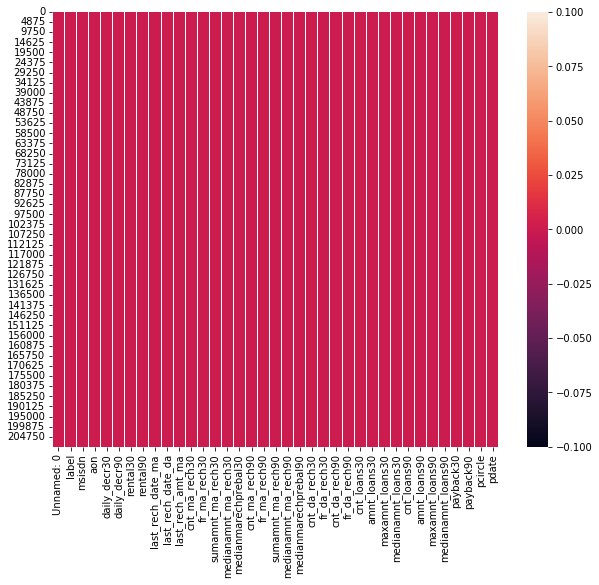

In [11]:
plt.figure(figsize=(10,8))
sns.heatmap(dfc.isnull())
plt.show()

There is no missing value present in data.

In [3]:
# Dropping the Unnamed:0 Column from data set

dfc.drop(['Unnamed: 0'],axis=1,inplace=True)

In [4]:
dfc.shape

(209593, 36)

In [4]:
import datetime as dt

In [5]:
# Convert the pdate columns to day, month and year

dfc['Day']=pd.to_datetime(dfc["pdate"],format="%Y/%m/%d").dt.day

In [6]:
dfc['Month']=pd.to_datetime(dfc["pdate"],format="%Y/%m/%d").dt.month

In [8]:
dfc.head(3)

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate,Day,Month
0,0,21408I70789,272.0,3055.05,3065.15,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.0,29.0,UPW,2016-07-20,20,7
1,1,76462I70374,712.0,12122.00,12124.75,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.0,0.0,UPW,2016-08-10,10,8
2,1,17943I70372,535.0,1398.00,1398.00,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.0,0.0,UPW,2016-08-19,19,8


In [7]:
# Lets drop the pdate column

dfc.drop(columns=['pdate'],axis=1,inplace=True)

In [10]:
dfc.shape

(209593, 37)

In [11]:
# Splitting the data into categorical and numerical data

categorical_data=[]
for i in dfc.dtypes.index:
    if dfc[i].dtypes=='object':
        categorical_data.append(i)
print(categorical_data)

['msisdn', 'pcircle']


In [12]:
numerical_data=[]
for i in dfc.dtypes.index:
    if dfc[i].dtypes!='object':
        numerical_data.append(i)
print(numerical_data)

['label', 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90', 'Day', 'Month']


In [13]:
dfc['pcircle'].unique()

array(['UPW'], dtype=object)

In [8]:
from sklearn.preprocessing import LabelEncoder

In [9]:
LE=LabelEncoder()

In [10]:
# Converting the categorical data to numerical data
dfc['msisdn']=LE.fit_transform(dfc['msisdn'])

In [11]:
dfc['msisdn'].head(5)

0     40191
1    142291
2     33594
3    104157
4      6910
Name: msisdn, dtype: int32

In [12]:
# Let's drop the pcircle column as it have only one unique value.
dfc.drop(columns=['pcircle'],axis=1,inplace=True)

In [28]:
dfc.head(5)

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,Day,Month
0,0,40191,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,20,7
1,1,142291,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,10,8
2,1,33594,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,19,8
3,1,104157,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,6,6
4,1,6910,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,22,6


In [29]:
dfc.dtypes

label                     int64
msisdn                    int32
aon                     float64
daily_decr30            float64
daily_decr90            float64
rental30                float64
rental90                float64
last_rech_date_ma       float64
last_rech_date_da       float64
last_rech_amt_ma          int64
cnt_ma_rech30             int64
fr_ma_rech30            float64
sumamnt_ma_rech30       float64
medianamnt_ma_rech30    float64
medianmarechprebal30    float64
cnt_ma_rech90             int64
fr_ma_rech90              int64
sumamnt_ma_rech90         int64
medianamnt_ma_rech90    float64
medianmarechprebal90    float64
cnt_da_rech30           float64
fr_da_rech30            float64
cnt_da_rech90             int64
fr_da_rech90              int64
cnt_loans30               int64
amnt_loans30              int64
maxamnt_loans30         float64
medianamnt_loans30      float64
cnt_loans90             float64
amnt_loans90              int64
maxamnt_loans90           int64
medianam

There is no object data dtypes

# Data Visualization

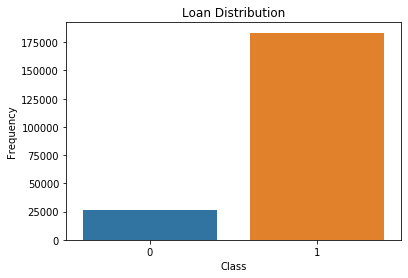

In [13]:
# Checking the count of label
sns.countplot(dfc['label'])
plt.xlabel("Class")
plt.ylabel("Frequency")
plt.title("Loan Distribution")
plt.show()

In [31]:
dfc['label'].value_counts()

1    183431
0     26162
Name: label, dtype: int64

1 represent sucess the people who have bought the loan, they will going to return. 0 represent failure, the people who bought the loan they are not going to pay the loan amount.

In [32]:
dfc.shape

(209593, 36)

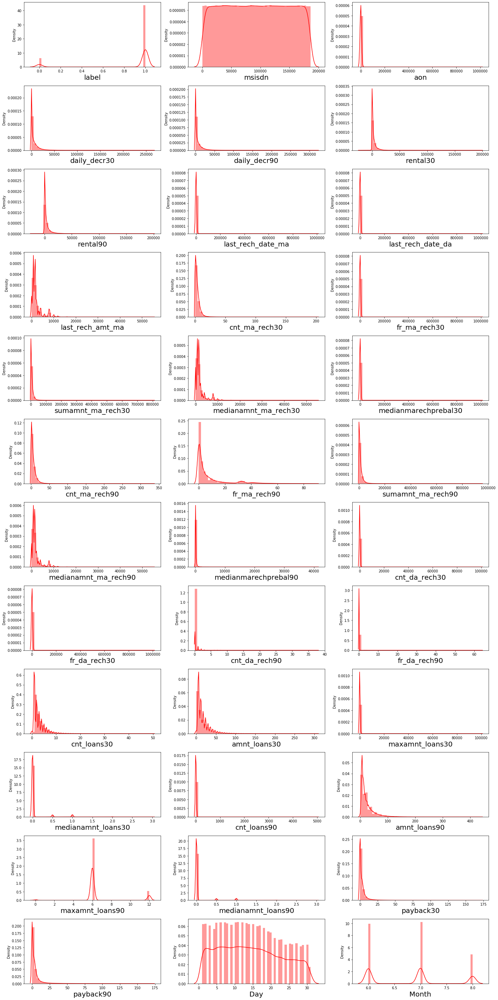

In [33]:
plt.figure(figsize=(20,40))
plot_number=1
for i in dfc:
    if plot_number<=36:
        ax=plt.subplot(12,3,plot_number)
        sns.distplot(dfc[i],color='red')
        plt.xlabel(i,fontsize=20)
    plot_number+=1
plt.tight_layout()

We see that most of the columns has skewness present and are not normally distributed.

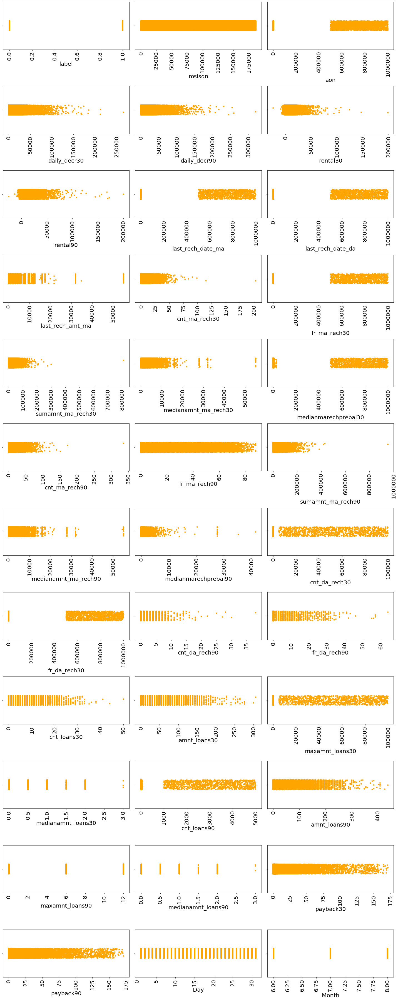

In [34]:
# Visualizing all the features using the stripplot
plt.figure(figsize=(20,50))
plot_number=1
for i in dfc:
    if plot_number<=36:
        ax=plt.subplot(12,3,plot_number)
        sns.stripplot(dfc[i],color='orange')
        plt.xticks(rotation=90,fontsize=20)
        plt.yticks(rotation=90,fontsize=20)
        plt.xlabel(i,fontsize=20)
    plot_number+=1
plt.tight_layout()

In the above visulaization, we see that maxamnt_loans30 lies maximum in the range of 2000 t0 100000, In Payback maximum lies between 0 to 150, In sumamnt_ma_rech90 lies maximum in the range of 0 to 200000. Some are highly spread in the range, some are moderately spread.

In [ ]:
Observation:


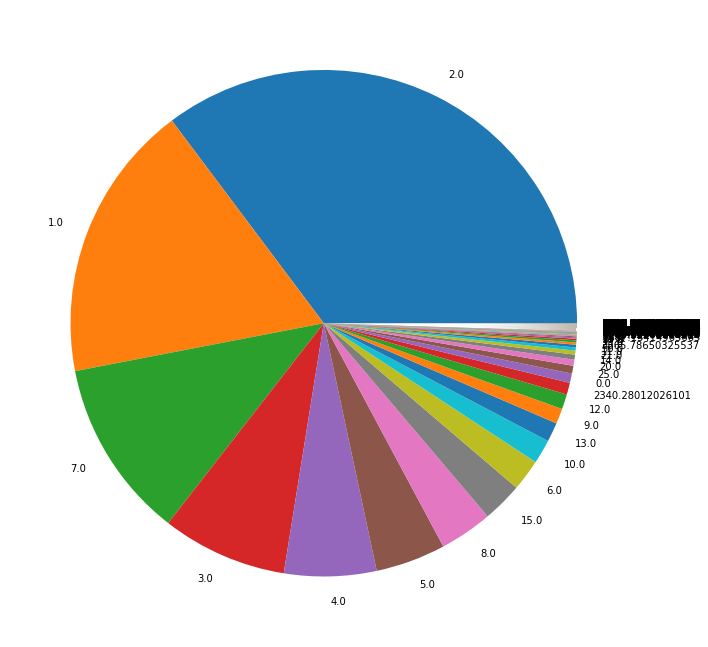

In [35]:
# Visualizing the pie chart for cnt_loans90
plt.figure(figsize=(10,15))
plt.pie(dfc['cnt_loans90'].value_counts(), labels=dfc['cnt_loans90'].unique(),shadow=False)
plt.tight_layout()
plt.show()

In the above pie chart as we see in cnt_loans90, 2.0 has maximum when compare to others.

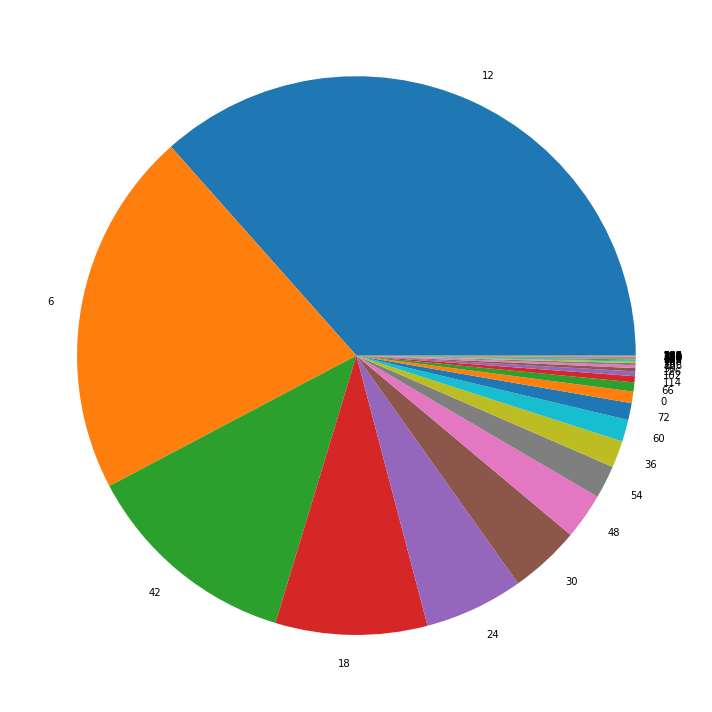

In [36]:
# Visualizing the pie chart for amnt_loans30
plt.figure(figsize=(10,15))
plt.pie(dfc['amnt_loans30'].value_counts(), labels=dfc['amnt_loans30'].unique(),shadow=False)
plt.tight_layout()
plt.show()

Total amount of loans taken by user in last 30 days is 12 is higher is than others.

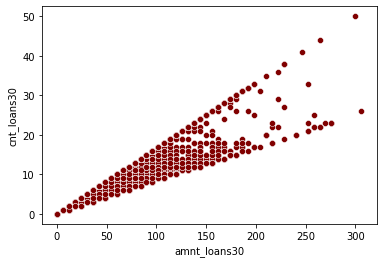

In [37]:
# Visualizing the scatterplot for amnt_loans30 and cnt_loans30
sns.scatterplot(dfc['amnt_loans30'],dfc['cnt_loans30'],color='maroon')
plt.show()

When we compare the amnt_loans30 and cnt_loans30 using scatterplot we observe that amnt_loans30 is increasing exponentially.

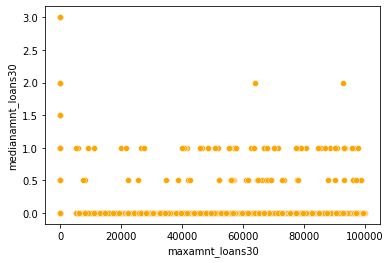

In [38]:
# Visualizing the scatterplot for maxamnt_loans30 and medianamnt_loans30
sns.scatterplot(dfc['maxamnt_loans30'],dfc['medianamnt_loans30'],color='orange')
plt.show()

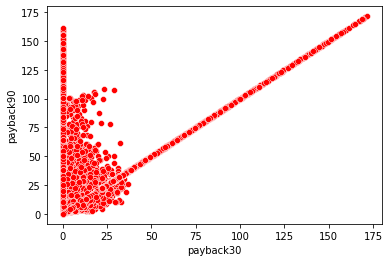

In [39]:
# Visualizing the scatterplot for payback30 and payback90
sns.scatterplot(dfc['payback30'],dfc['payback90'],color='red')
plt.show()

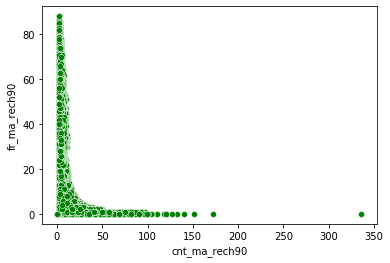

In [28]:
# Visualizing the scatterplot for cnt_ma_rech90 and fr_ma_rech90
sns.scatterplot(dfc['cnt_ma_rech90'],dfc['fr_ma_rech90'],color='green')
plt.show()

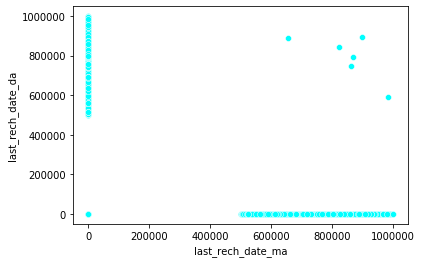

In [29]:
# Visualizing the scatterplot for last_rech_date_ma and last_rech_date_da
sns.scatterplot(dfc['last_rech_date_ma'],dfc['last_rech_date_da'],color='aqua')
plt.show()

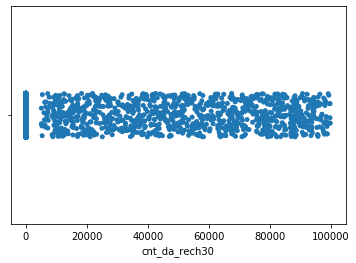

In [40]:
sns.stripplot(dfc['cnt_da_rech30'])
plt.show()

In [ ]:
dfc.columns

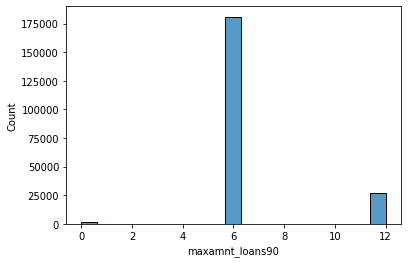

In [19]:
sns.histplot(dfc['maxamnt_loans90'])

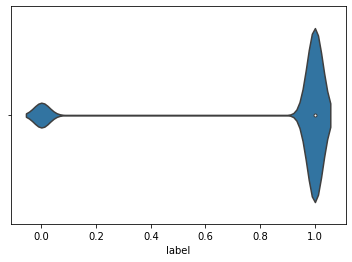

In [22]:
sns.violinplot(dfc['label'])

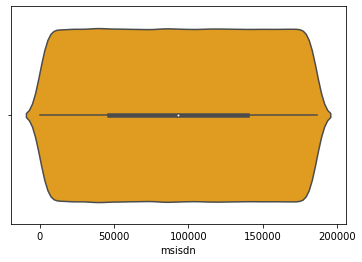

In [23]:
sns.violinplot(dfc['msisdn'],color='orange')

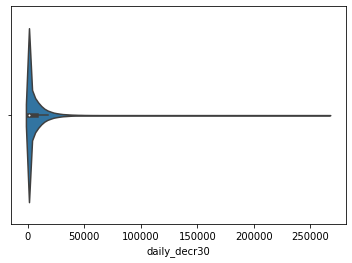

In [24]:
sns.violinplot(dfc['daily_decr30'])

In daily_decr30 maximum lies in 0 to 1000 after it goes linear.

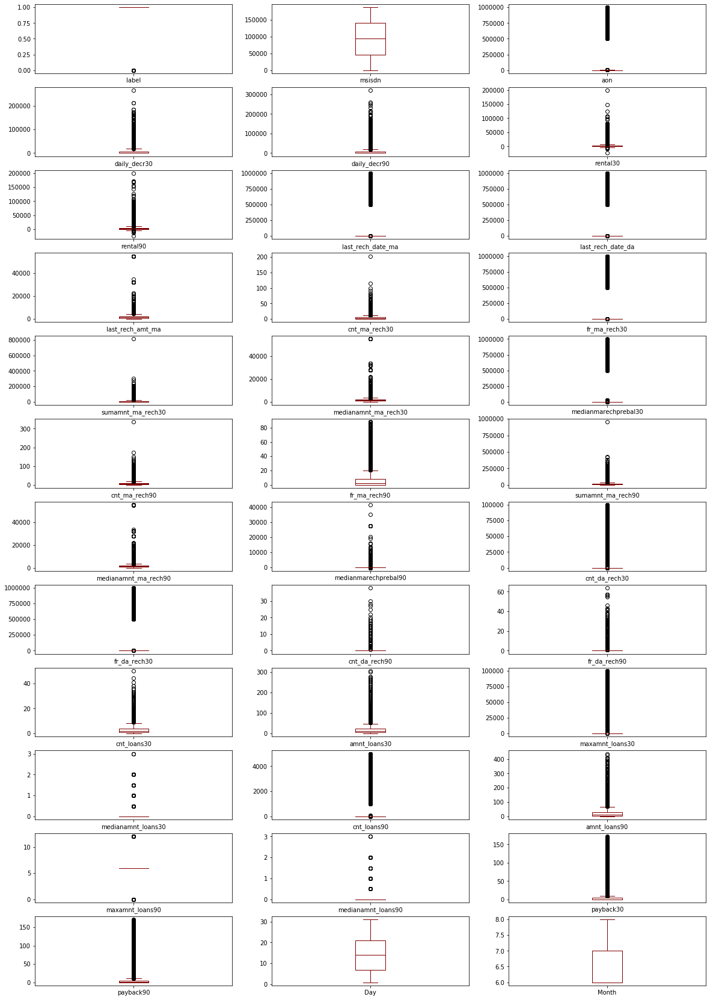

In [26]:
dfc.plot(kind='box',subplots=True,layout=(12,3),figsize=(20,30),color='maroon')
plt.show()

Outliers is almost present in all the columns. We will remove the outliers using the appropriate method.

In [30]:
dfc.corr()

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,Day,Month
label,1.000000,0.001976,-0.003785,0.168298,0.166150,0.058085,0.075521,0.003728,0.001711,0.131804,0.237331,0.001330,0.202828,0.141490,-0.004829,0.236392,0.084385,0.205793,0.120855,0.039300,0.003827,-0.000027,0.002999,-0.005418,0.196283,0.197272,0.000248,0.044589,0.004733,0.199788,0.084144,0.035747,0.048336,0.049183,0.006825,0.154949
msisdn,0.001976,1.000000,0.000566,0.000717,0.000950,-0.001404,-0.000691,-0.000928,0.001400,-0.002368,0.000617,-0.001804,0.001094,0.000668,-0.000238,-0.001859,-0.004413,-0.000936,-0.000625,-0.000615,-0.001720,-0.000241,0.004595,-0.002233,0.001765,0.002170,-0.000755,0.000986,0.001859,-0.000155,0.003286,0.001210,0.002922,0.002671,0.002466,-0.002986
aon,-0.003785,0.000566,1.000000,0.001104,0.000374,-0.000960,-0.000790,0.001692,-0.001693,0.004256,-0.003148,-0.001163,0.000707,0.004306,0.003930,-0.002725,0.004401,0.001011,0.004909,-0.000859,0.001564,0.000892,0.001121,0.005395,-0.001826,-0.001726,-0.002764,0.004664,-0.000611,-0.002319,-0.001191,0.002771,0.001940,0.002203,0.000662,-0.001863
daily_decr30,0.168298,0.000717,0.001104,1.000000,0.977704,0.442066,0.458977,0.000487,-0.001636,0.275837,0.451385,-0.000577,0.636536,0.295356,-0.001153,0.587338,-0.078299,0.762981,0.257847,0.037495,0.000700,-0.001499,0.038814,0.020673,0.366116,0.471492,-0.000028,-0.011610,0.008962,0.563496,0.400199,-0.037305,0.026915,0.047175,0.006477,0.518664
daily_decr90,0.166150,0.000950,0.000374,0.977704,1.000000,0.434685,0.471730,0.000908,-0.001886,0.264131,0.426707,-0.000343,0.603886,0.282960,-0.000746,0.593069,-0.079530,0.768817,0.250518,0.036382,0.000661,-0.001570,0.031155,0.016437,0.340387,0.447869,0.000025,-0.005591,0.009446,0.567204,0.397251,-0.034686,0.019400,0.040800,-0.021508,0.539410
rental30,0.058085,-0.001404,-0.000960,0.442066,0.434685,1.000000,0.955237,-0.001095,0.003261,0.127271,0.233343,-0.001219,0.272649,0.129853,-0.001415,0.312118,-0.033530,0.342306,0.110356,0.027170,-0.001105,-0.002558,0.072255,0.046761,0.180203,0.233453,-0.000864,-0.016482,0.004012,0.298943,0.234211,-0.035489,0.072974,0.095147,0.036537,0.365699
rental90,0.075521,-0.000691,-0.000790,0.458977,0.471730,0.955237,1.000000,-0.001688,0.002794,0.121416,0.230260,-0.000503,0.259709,0.120242,-0.001237,0.345293,-0.036524,0.360601,0.103151,0.029547,-0.000548,-0.002345,0.056282,0.036886,0.171595,0.231906,-0.001411,-0.009467,0.005141,0.327436,0.251029,-0.034122,0.067110,0.099501,0.008941,0.429407
last_rech_date_ma,0.003728,-0.000928,0.001692,0.000487,0.000908,-0.001095,-0.001688,1.000000,0.001790,-0.000147,0.004311,-0.001629,0.002105,-0.001358,0.004071,0.004263,0.001414,0.002243,-0.000726,-0.001086,-0.003467,-0.003626,-0.003538,-0.002395,0.001193,0.000903,0.000928,0.001835,-0.000225,0.000870,-0.001123,0.002771,-0.002233,-0.001583,0.000560,-0.001207
last_rech_date_da,0.001711,0.001400,-0.001693,-0.001636,-0.001886,0.003261,0.002794,0.001790,1.000000,-0.000149,0.001549,0.001158,0.000046,0.001037,0.002849,0.001272,0.000798,-0.000414,0.000219,0.004158,-0.003628,-0.000074,-0.001859,-0.000203,0.000380,0.000536,0.000503,0.000061,-0.000972,0.000519,0.001524,-0.002239,0.000077,0.000417,0.000631,-0.001800
last_rech_amt_ma,0.131804,-0.002368,0.004256,0.275837,0.264131,0.127271,0.121416,-0.000147,-0.000149,1.000000,-0.002662,0.002876,0.440821,0.794646,-0.002342,0.016707,0.106267,0.418735,0.818734,0.124646,-0.001837,-0.003230,0.014779,0.016042,-0.027612,0.008502,0.001000,0.028370,0.000093,0.014067,0.148460,0.021004,-0.027369,-0.014260,0.028883,0.096919


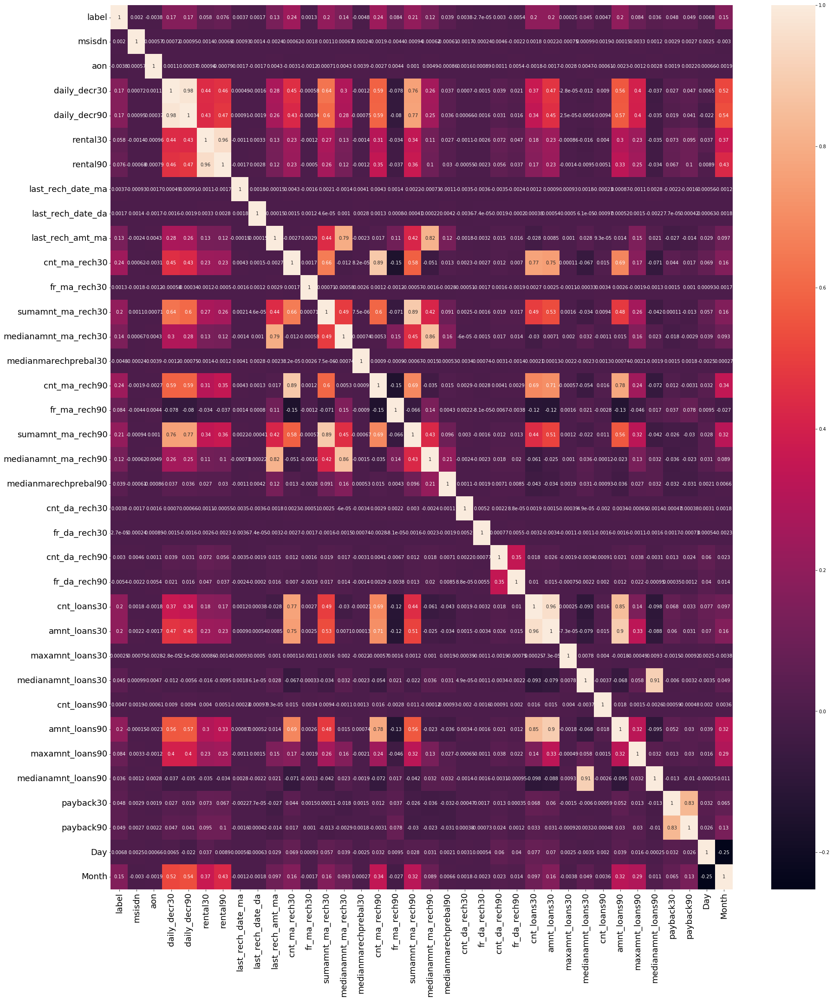

In [31]:
plt.figure(figsize=(30,35))
sns.heatmap(dfc.corr(),annot=True)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

There exist a lot of multicollinearity between 'fr_da_rech30' and 'fr_da_rech90'; 'maxamnt_loans30' and 'maxamnt_loans90' ; 'rental30' and 'rental90'; 'cnt_ma_rech30' and 'cnt_ma_rech90' ; 'sumamnt_ma_rech30' and 'sumamnt_ma_rech90' ; 'cnt_loans30' and 'cnt_loans90' ; 'amnt_loans30' and 'amnt_loans90' ; 'medianamnt_loans30' and 'medianamnt_loans90' . Hence we can drop either column from each group which is least correlated with the target column.

In [33]:
dfc.columns

Index(['label', 'msisdn', 'aon', 'daily_decr30', 'daily_decr90', 'rental30',
       'rental90', 'last_rech_date_ma', 'last_rech_date_da',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30',
       'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30',
       'payback90', 'Day', 'Month'],
      dtype='object')

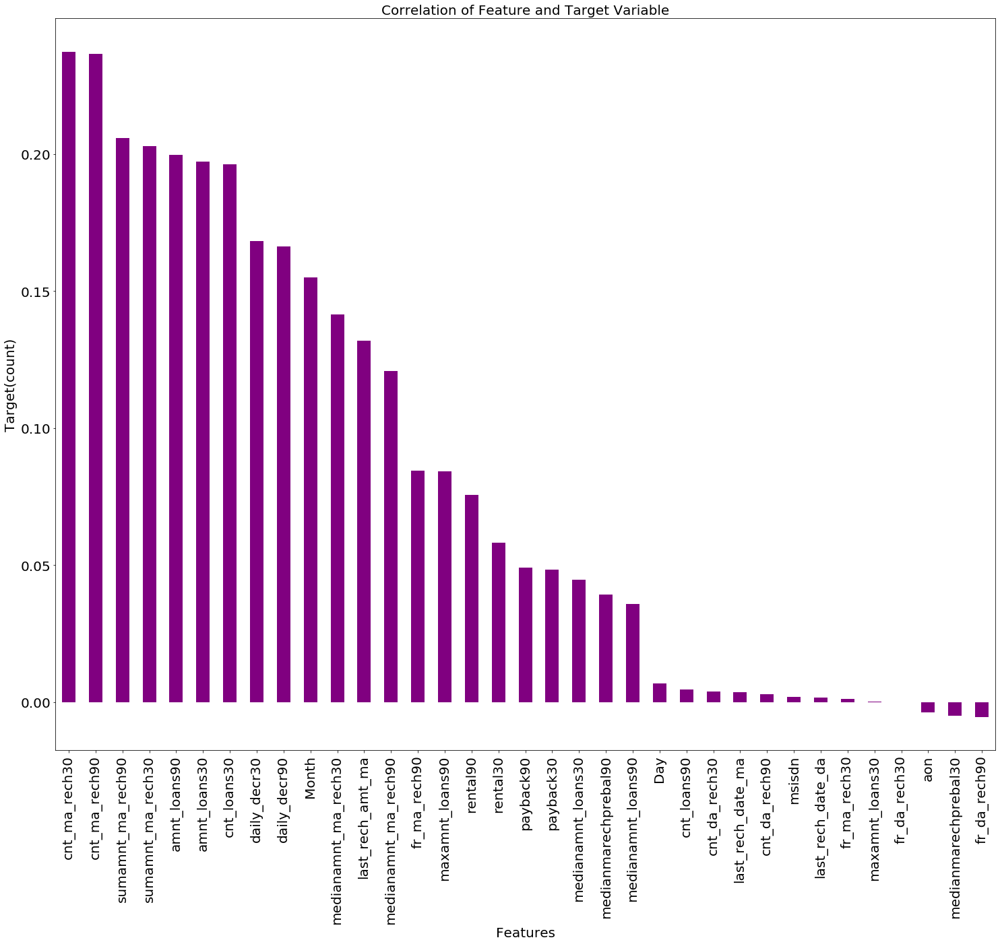

In [32]:
plt.figure(figsize=(25,20))
dfc.corr()['label'].sort_values(ascending=False).drop(['label']).plot(kind='bar',color='purple')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Features',fontsize=20)
plt.ylabel('Target(count)',fontsize=20)
plt.title('Correlation of Feature and Target Variable',fontsize=20)
plt.show()

In maximumnt_loan30 is leass correlated and cnt_ma_rech30, cnt_ma_rech90 is highly correlated as we see in the above correlation diagram.

# Outliers

In [14]:
from scipy.stats import zscore

In [15]:
z=np.abs(zscore(dfc))
z

array([[2.64789583, 0.984213  , 0.10357685, ..., 2.39409346, 0.6637208 ,
        0.27336037],
       [0.37765836, 0.91502744, 0.09776412, ..., 0.41923266, 0.52127058,
        1.62209905],
       [0.37765836, 1.10692885, 0.10010243, ..., 0.41923266, 0.54522166,
        1.62209905],
       ...,
       [0.37765836, 0.7274342 , 0.09378769, ..., 0.04735622, 1.73021304,
        0.27336037],
       [0.37765836, 0.34017702, 0.08428915, ..., 0.59938541, 1.25621649,
        0.27336037],
       [0.37765836, 0.52386948, 0.08628398, ..., 0.41923266, 0.87676799,
        0.27336037]])

In [16]:
# Outliers Removal
dfc_new=dfc[(z<6).all(axis=1)]

In [17]:
dfc_new.shape

(193906, 36)

In [18]:
dfc.shape

(209593, 36)

In [19]:
data_loss=((209593-193906)/209593)*100
data_loss

7.48450568482726

7.4% Data is removed in the Outliers process.

# Skewness

In [20]:
dfc.skew()

label                   -2.270254
msisdn                   0.000719
aon                     10.392949
daily_decr30             3.946230
daily_decr90             4.252565
rental30                 4.521929
rental90                 4.437681
last_rech_date_ma       14.790974
last_rech_date_da       14.814857
last_rech_amt_ma         3.781149
cnt_ma_rech30            3.283842
fr_ma_rech30            14.772833
sumamnt_ma_rech30        6.386787
medianamnt_ma_rech30     3.512324
medianmarechprebal30    14.779875
cnt_ma_rech90            3.425254
fr_ma_rech90             2.285423
sumamnt_ma_rech90        4.897950
medianamnt_ma_rech90     3.752706
medianmarechprebal90    44.880503
cnt_da_rech30           17.818364
fr_da_rech30            14.776430
cnt_da_rech90           27.267278
fr_da_rech90            28.988083
cnt_loans30              2.713421
amnt_loans30             2.975719
maxamnt_loans30         17.658052
medianamnt_loans30       4.551043
cnt_loans90             16.594408
amnt_loans90  

Skewness is present is aon, last_rech_date_ma, last_rech_date_da,fr_ma_rech30,medianmarechprebal30,medianmarechprebal90,cnt_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans90.                                                                                         

In [21]:
# Skewness Removal

from sklearn.preprocessing import PowerTransformer

In [22]:
scaled=PowerTransformer(method='yeo-johnson')
scaled

PowerTransformer()

In [23]:
features=['aon','last_rech_date_ma','last_rech_date_da','fr_ma_rech30','medianmarechprebal30','medianmarechprebal90','cnt_da_rech30','fr_da_rech30','cnt_da_rech90','fr_da_rech90','maxamnt_loans30','cnt_loans90']

In [24]:
dfc_new[features]=scaled.fit_transform(dfc_new[features].values)

In [25]:
dfc_new[features].head()

,aon,last_rech_date_ma,last_rech_date_da,fr_ma_rech30,medianmarechprebal30,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,maxamnt_loans30,cnt_loans90
0,-0.724584,-0.367676,-0.103635,1.714691,-0.418163,-0.472165,-0.108569,-0.013436,-0.147284,-0.017446,-0.110859,-0.180500
1,0.249441,1.429029,-0.103635,-1.119530,-0.022066,-0.024723,-0.108569,-0.013436,-0.147284,-0.017446,1.478009,-1.031383
2,-0.108210,-0.245440,-0.103635,-1.119530,0.011424,0.013964,-0.108569,-0.013436,-0.147284,-0.017446,-0.110859,-1.031383
3,-0.808138,3.144530,-0.103635,-1.119530,-0.501982,-0.528102,-0.108569,-0.013436,-0.147284,-0.017446,-0.110859,-0.180500
4,0.682076,-0.128791,-0.103635,0.170603,-0.241020,-0.225508,-0.108569,-0.013436,-0.147284,-0.017446,-0.110859,1.239849


In [26]:
dfc_new.skew()

label                   -2.255405
msisdn                  -0.000357
aon                      0.304295
daily_decr30             2.453814
daily_decr90             2.595149
rental30                 2.631426
rental90                 2.759309
last_rech_date_ma        0.129126
last_rech_date_da      -56.377112
last_rech_amt_ma         2.248388
cnt_ma_rech30            1.829448
fr_ma_rech30             0.135848
sumamnt_ma_rech30        2.280079
medianamnt_ma_rech30     2.455330
medianmarechprebal30     2.054867
cnt_ma_rech90            1.989332
fr_ma_rech90             2.259902
sumamnt_ma_rech90        2.354024
medianamnt_ma_rech90     2.467533
medianmarechprebal90     1.436022
cnt_da_rech30            9.102207
fr_da_rech30            74.412749
cnt_da_rech90            6.642382
fr_da_rech90            57.302648
cnt_loans30              2.061551
amnt_loans30             2.093557
maxamnt_loans30         -0.937848
medianamnt_loans30       4.082281
cnt_loans90              0.094942
amnt_loans90  

In [97]:
dfc_new=dfc_new.drop(columns=['last_rech_date_da','fr_da_rech30','fr_da_rech90'],axis=1)

In [98]:
dfc_new.skew()

label                  -2.255405
msisdn                 -0.000357
aon                     0.304295
daily_decr30            2.453814
daily_decr90            2.595149
rental30                2.631426
rental90                2.759309
last_rech_date_ma       0.129126
last_rech_amt_ma        2.248388
cnt_ma_rech30           1.829448
fr_ma_rech30            0.135848
sumamnt_ma_rech30       2.280079
medianamnt_ma_rech30    2.455330
medianmarechprebal30    2.054867
cnt_ma_rech90           1.989332
fr_ma_rech90            2.259902
sumamnt_ma_rech90       2.354024
medianamnt_ma_rech90    2.467533
medianmarechprebal90    1.436022
cnt_da_rech30           9.102207
cnt_da_rech90           6.642382
cnt_loans30             2.061551
amnt_loans30            2.093557
maxamnt_loans30        -0.937848
medianamnt_loans30      4.082281
cnt_loans90             0.094942
amnt_loans90            2.333483
maxamnt_loans90         1.733874
medianamnt_loans90      4.461115
payback30               4.137861
payback90 

We have removed all the skewness present in the data. Our data is now good to proceed.

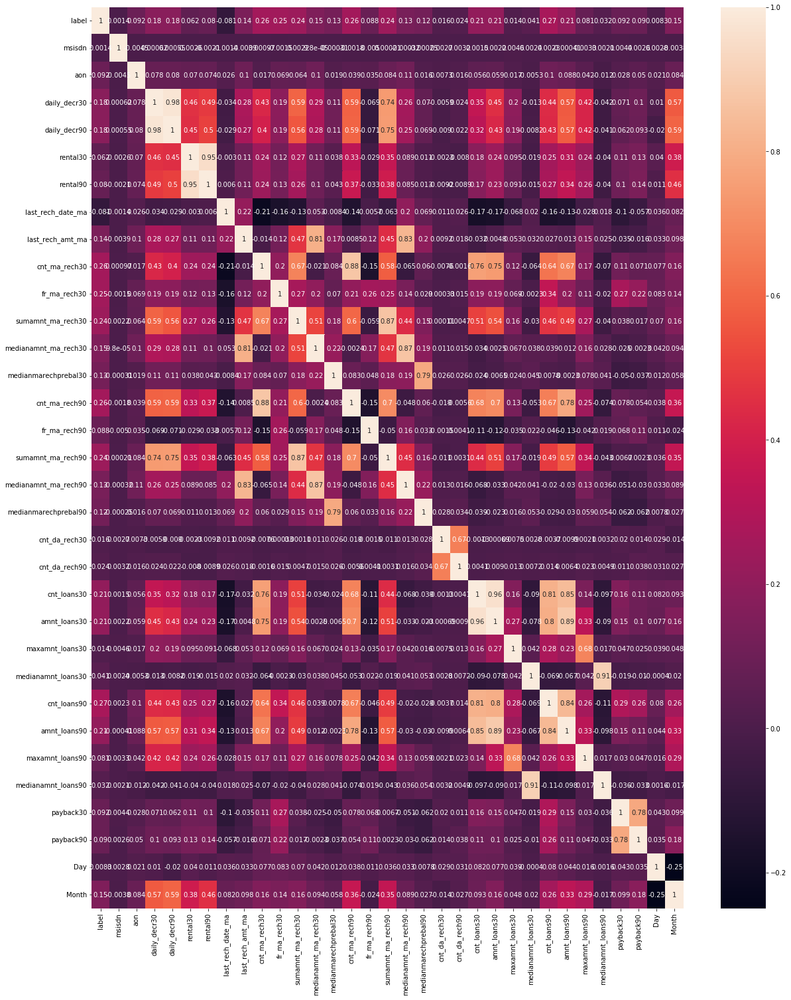

In [101]:
# Checking the Correlation
plt.figure(figsize=(20,25))
sns.heatmap(dfc_new.corr(),annot=True)
plt.show()

# Splitting the data into Features(x) and Target(y) Variable

In [27]:
x=dfc_new.drop(columns=['label'],axis=1)
x.head()

,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,Day,Month
0,40191,-0.724584,3055.050000,3065.150000,220.13,260.13,-0.367676,-0.103635,1539,2,1.714691,3078.0,1539.0,-0.418163,2,21,3078,1539.0,-0.472165,-0.108569,-0.013436,-0.147284,-0.017446,2,12,-0.110859,0.0,-0.180500,12,6,0.0,29.000000,29.000000,20,7
1,142291,0.249441,12122.000000,12124.750000,3691.26,3691.26,1.429029,-0.103635,5787,1,-1.119530,5787.0,5787.0,-0.022066,1,0,5787,5787.0,-0.024723,-0.108569,-0.013436,-0.147284,-0.017446,1,12,1.478009,0.0,-1.031383,12,12,0.0,0.000000,0.000000,10,8
2,33594,-0.108210,1398.000000,1398.000000,900.13,900.13,-0.245440,-0.103635,1539,1,-1.119530,1539.0,1539.0,0.011424,1,0,1539,1539.0,0.013964,-0.108569,-0.013436,-0.147284,-0.017446,1,6,-0.110859,0.0,-1.031383,6,6,0.0,0.000000,0.000000,19,8
3,104157,-0.808138,21.228000,21.228000,159.42,159.42,3.144530,-0.103635,947,0,-1.119530,0.0,0.0,-0.501982,1,0,947,947.0,-0.528102,-0.108569,-0.013436,-0.147284,-0.017446,2,12,-0.110859,0.0,-0.180500,12,6,0.0,0.000000,0.000000,6,6
4,6910,0.682076,150.619333,150.619333,1098.90,1098.90,-0.128791,-0.103635,2309,7,0.170603,20029.0,2309.0,-0.241020,8,2,23496,2888.0,-0.225508,-0.108569,-0.013436,-0.147284,-0.017446,7,42,-0.110859,0.0,1.239849,42,6,0.0,2.333333,2.333333,22,6


In [28]:
y=dfc_new['label']
y.head()

0    0
1    1
2    1
3    1
4    1
Name: label, dtype: int64

In [161]:
x.shape

(193906, 32)

In [162]:
y.shape

(193906,)

# Balancing the target variable

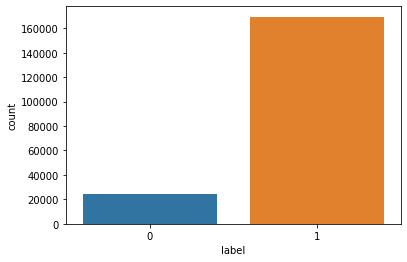

In [29]:
dfc_new['label'].value_counts()
sns.countplot(dfc_new['label'])
plt.show()

Our target label is imbalance, So, let's balance the data.

In [30]:
from imblearn.over_sampling import SMOTE

In [31]:
SM=SMOTE()
x,y=SM.fit_resample(x,y)

In [32]:
y.value_counts()

0    169493
1    169493
Name: label, dtype: int64

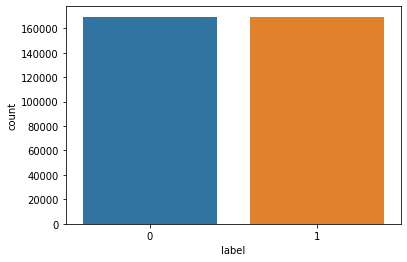

In [33]:
sns.countplot(y)

# Standard Scaler

In [34]:
from sklearn.preprocessing import StandardScaler

In [35]:
scaler=StandardScaler()
scaler

StandardScaler()

In [36]:
x.shape

(338986, 35)

In [37]:
x_scaled=scaled.fit_transform(x)

In [38]:
x_scaled

array([[-0.92750191, -0.62844439,  0.74240814, ...,  1.70740498,
         0.79639683,  0.76293185],
       [ 0.90239504,  0.45415373,  1.39829159, ..., -0.80751768,
        -0.44505297,  1.65051404],
       [-1.0782184 ,  0.08173065,  0.42436067, ..., -0.80751768,
         0.68329773,  1.65051404],
       ...,
       [ 1.53651168, -1.55281472, -1.32517999, ..., -0.80751768,
        -1.58525596, -0.98000783],
       [-0.67113953,  0.55959759, -1.15413212, ..., -0.80751768,
        -0.17287281, -0.98000783],
       [-1.40433492, -0.09446521,  0.1308788 , ...,  0.60717248,
        -1.39435211,  0.76293185]])

# Model Building

In [39]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier


In [169]:
x_scaled.shape

(338986, 32)

In [170]:
y.shape

(338986,)

In [40]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=.30,random_state=54)

In [41]:
x_train.shape

(237290, 35)

In [42]:
x_test.shape

(101696, 35)

In [43]:
y_train.shape

(237290,)

In [44]:
y_test.shape

(101696,)

# Logistic Regression

In [66]:
lg=LogisticRegression()
lg.fit(x_train,y_train)

LogisticRegression()

In [180]:
lg_pred=lg.predict(x_test)
print("Predicted value:\n",lg_pred)

Predicted value:
 [0 0 1 ... 1 0 0]


In [182]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print("Accuracy Score:",accuracy_score(y_test,lg_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(y_test,lg_pred),'\n')
print("Classification Report:\n",classification_report(y_test,lg_pred))

Accuracy Score: 0.8154991346758967 

Confusion Matrix:
 [[41722  9274]
 [ 9489 41211]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.82      0.82     50996
           1       0.82      0.81      0.81     50700

    accuracy                           0.82    101696
   macro avg       0.82      0.82      0.82    101696
weighted avg       0.82      0.82      0.82    101696



 We got the 81% accuracy in Logistic Regression.

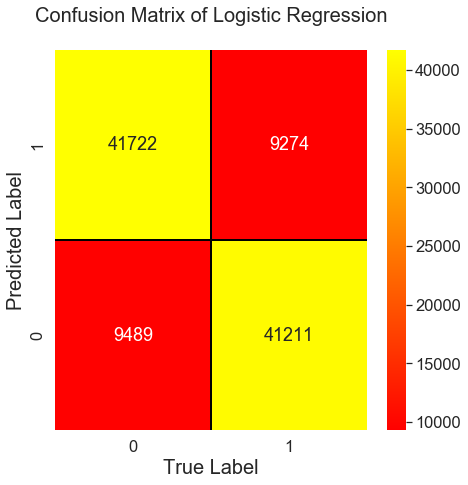

In [184]:
CM=confusion_matrix(y_test,lg_pred)

x_axis=['0','1']
y_axis=['1','0']

figure,axes=plt.subplots(figsize=(7,7))

sns.set(font_scale=1.5)

sns.heatmap(CM, axes=axes,annot=True,linecolor='black',xticklabels=x_axis,yticklabels=y_axis,cmap='autumn',fmt='0.0f',linewidth=.2)

plt.xlabel('True Label',fontsize=20)
plt.ylabel('Predicted Label',fontsize=20)

plt.title("Confusion Matrix of Logistic Regression\n",fontsize=20)

plt.show()


# Decision Tree Classifier

In [67]:
dr=DecisionTreeClassifier()
dr.fit(x_train,y_train)

DecisionTreeClassifier()

In [189]:
dr_pred=dr.predict(x_test)
print("Predicted value:\n",dr_pred)

Predicted value:
 [0 0 1 ... 1 0 1]


In [190]:
print("Accuracy Score:",accuracy_score(y_test,dr_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(y_test,dr_pred),'\n')
print("Classification Report:\n",classification_report(y_test,dr_pred))

Accuracy Score: 0.9038801919446192 

Confusion Matrix:
 [[46385  4611]
 [ 5164 45536]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.91      0.90     50996
           1       0.91      0.90      0.90     50700

    accuracy                           0.90    101696
   macro avg       0.90      0.90      0.90    101696
weighted avg       0.90      0.90      0.90    101696



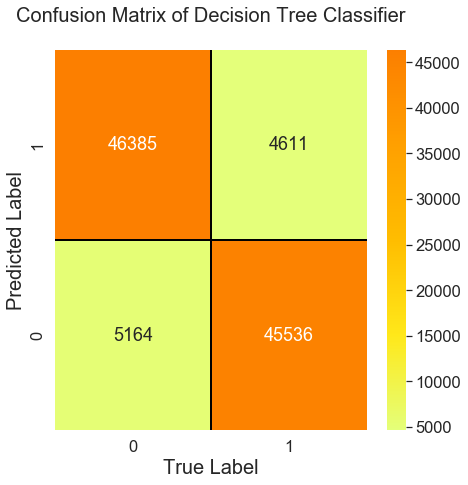

In [191]:
CM=confusion_matrix(y_test,dr_pred)

x_axis=['0','1']
y_axis=['1','0']

figure,axes=plt.subplots(figsize=(7,7))

sns.set(font_scale=1.5)

sns.heatmap(CM, axes=axes,annot=True,linecolor='black',xticklabels=x_axis,yticklabels=y_axis,cmap='Wistia',fmt='0.0f',linewidth=.2)

plt.xlabel('True Label',fontsize=20)
plt.ylabel('Predicted Label',fontsize=20)

plt.title("Confusion Matrix of Decision Tree Classifier\n",fontsize=20)

plt.show()

In Decision Tree Classifier, we got 90% accuracy.

# Random Forest Classifier

In [45]:
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)

RandomForestClassifier()

In [46]:
rfc_pred=rfc.predict(x_test)
print("Predicted value:\n",rfc_pred)

Predicted value:
 [0 0 1 ... 1 0 1]


In [48]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix

In [49]:
print("Accuracy Score:",accuracy_score(y_test,rfc_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(y_test,rfc_pred),'\n')
print("Classification Report:\n",classification_report(y_test,rfc_pred))

Accuracy Score: 0.9446979232221523 

Confusion Matrix:
 [[47823  3173]
 [ 2451 48249]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.94      0.94     50996
           1       0.94      0.95      0.94     50700

    accuracy                           0.94    101696
   macro avg       0.94      0.94      0.94    101696
weighted avg       0.94      0.94      0.94    101696



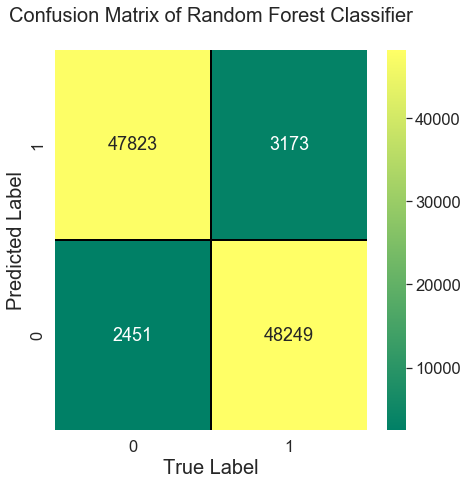

In [51]:
CM=confusion_matrix(y_test,rfc_pred)

x_axis=['0','1']
y_axis=['1','0']

figure,axes=plt.subplots(figsize=(7,7))

sns.set(font_scale=1.5)

sns.heatmap(CM, axes=axes,annot=True,linecolor='black',xticklabels=x_axis,yticklabels=y_axis,cmap='summer',fmt='0.0f',linewidth=.2)

plt.xlabel('True Label',fontsize=20)
plt.ylabel('Predicted Label',fontsize=20)

plt.title("Confusion Matrix of Random Forest Classifier\n",fontsize=20)

plt.show()

In Random Forest Classifier, we got 94% Accuracy.

# Grandient Boosting Classifier

In [52]:
gbc=GradientBoostingClassifier()
gbc.fit(x_train,y_train)

GradientBoostingClassifier()

In [53]:
gbc_pred=gbc.predict(x_test)
print("Predicted value:\n",gbc_pred)

Predicted value:
 [0 0 1 ... 1 0 1]


In [54]:
print("Accuracy Score:",accuracy_score(y_test,gbc_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(y_test,gbc_pred),'\n')
print("Classification Report:\n",classification_report(y_test,gbc_pred))

Accuracy Score: 0.906564663310258 

Confusion Matrix:
 [[46785  4211]
 [ 5291 45409]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.92      0.91     50996
           1       0.92      0.90      0.91     50700

    accuracy                           0.91    101696
   macro avg       0.91      0.91      0.91    101696
weighted avg       0.91      0.91      0.91    101696



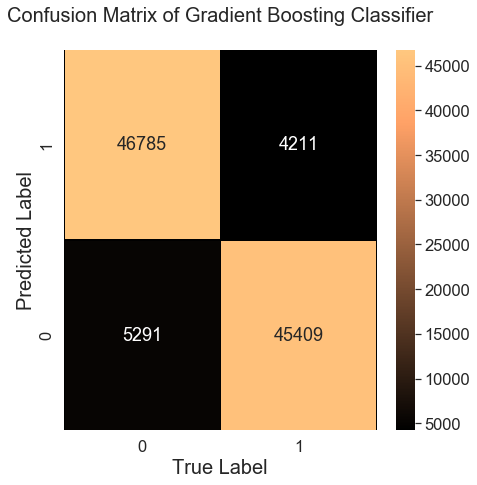

In [55]:
CM=confusion_matrix(y_test,gbc_pred)

x_axis=['0','1']
y_axis=['1','0']

figure,axes=plt.subplots(figsize=(7,7))

sns.set(font_scale=1.5)

sns.heatmap(CM, axes=axes,annot=True,linecolor='black',xticklabels=x_axis,yticklabels=y_axis,cmap='copper',fmt='0.0f',linewidth=.2)

plt.xlabel('True Label',fontsize=20)
plt.ylabel('Predicted Label',fontsize=20)

plt.title("Confusion Matrix of Gradient Boosting Classifier\n",fontsize=20)

plt.show()

In Gradient Boosting Classifier, we got 90% accuracy.

# SGD Classifier

In [56]:
sgd=SGDClassifier()
sgd.fit(x_train,y_train)

SGDClassifier()

In [57]:
sgd_pred=sgd.predict(x_test)
print("Predicted value:\n",sgd_pred)

Predicted value:
 [0 0 1 ... 1 0 0]


In [58]:
print("Accuracy Score:",accuracy_score(y_test,sgd_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(y_test,sgd_pred),'\n')
print("Classification Report:\n",classification_report(y_test,sgd_pred))

Accuracy Score: 0.8187342668344871 

Confusion Matrix:
 [[42483  8513]
 [ 9921 40779]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.83      0.82     50996
           1       0.83      0.80      0.82     50700

    accuracy                           0.82    101696
   macro avg       0.82      0.82      0.82    101696
weighted avg       0.82      0.82      0.82    101696



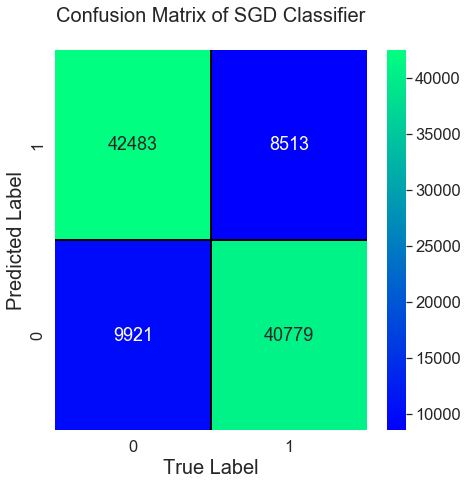

In [60]:
CM=confusion_matrix(y_test,sgd_pred)

x_axis=['0','1']
y_axis=['1','0']

figure,axes=plt.subplots(figsize=(7,7))

sns.set(font_scale=1.5)

sns.heatmap(CM, axes=axes,annot=True,linecolor='black',xticklabels=x_axis,yticklabels=y_axis,cmap='winter',fmt='0.0f',linewidth=.2)

plt.xlabel('True Label',fontsize=20)
plt.ylabel('Predicted Label',fontsize=20)

plt.title("Confusion Matrix of SGD Classifier\n",fontsize=20)

plt.show()

# KNeighbors Classifier

In [61]:
knn=KNeighborsClassifier()
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [62]:
knn_pred=knn.predict(x_test)
print("Predicted value:\n",knn_pred)

Predicted value:
 [0 0 1 ... 0 0 1]


In [63]:
print("Accuracy Score:",accuracy_score(y_test,knn_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(y_test,knn_pred),'\n')
print("Classification Report:\n",classification_report(y_test,knn_pred))

Accuracy Score: 0.8879503618628068 

Confusion Matrix:
 [[47647  3349]
 [ 8046 42654]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.93      0.89     50996
           1       0.93      0.84      0.88     50700

    accuracy                           0.89    101696
   macro avg       0.89      0.89      0.89    101696
weighted avg       0.89      0.89      0.89    101696



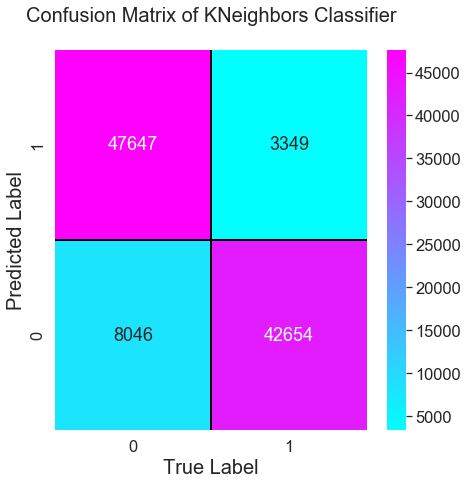

In [64]:
CM=confusion_matrix(y_test,knn_pred)

x_axis=['0','1']
y_axis=['1','0']

figure,axes=plt.subplots(figsize=(7,7))

sns.set(font_scale=1.5)

sns.heatmap(CM, axes=axes,annot=True,linecolor='black',xticklabels=x_axis,yticklabels=y_axis,cmap='cool',fmt='0.0f',linewidth=.2)

plt.xlabel('True Label',fontsize=20)
plt.ylabel('Predicted Label',fontsize=20)

plt.title("Confusion Matrix of KNeighbors Classifier\n",fontsize=20)

plt.show()

In KNeighbors Classifier, we got 88% accuracy.

In [68]:
for clf in (lg, rfc, dr, gbc, sgd, knn):
    clf.fit(x_train,y_train)
    clf_pred=clf.predict(x_test)
    print(clf.__class__.__name__,accuracy_score(y_test,clf_pred))

LogisticRegression 0.8187637665198237
RandomForestClassifier 0.9447470893643801
DecisionTreeClassifier 0.9068399937067338
GradientBoostingClassifier 0.906564663310258
SGDClassifier 0.8198060887350535
KNeighborsClassifier 0.8879503618628068


Random Forest Classifier gives a good accuracy score 94%, as compare with Other model.

# Cross Validation Score

In [72]:
print("Cross Validation score for Logistic Regression:",cross_val_score(lg,x,y,cv=5).mean()*100)
print("Cross Validation score for Random Forest Classifier:",cross_val_score(rfc,x,y,cv=5).mean()*100)
print("Cross Validation score for Decision Tree Classifier:",cross_val_score(dr,x,y,cv=5).mean()*100)
print("Cross Validation score for Gradient Bossting Classifier:",cross_val_score(gbc,x,y,cv=5).mean()*100)
print("Cross Validation score for SGD Classifier:",cross_val_score(sgd,x,y,cv=5).mean()*100)
print("Cross Validation score for KNeighbors Classifier:",cross_val_score(knn,x,y,cv=5).mean()*100)

Cross Validation score for Logistic Regression: 73.94730190558344
Cross Validation score for Random Forest Classifier: 93.79358427578683
Cross Validation score for Decision Tree Classifier: 89.9671667906081
Cross Validation score for Gradient Bossting Classifier: 90.44240428476913
Cross Validation score for SGD Classifier: 61.187803599492995
Cross Validation score for KNeighbors Classifier: 86.00443723692726


On analysis of various models and their cross validation score, we came to know that Random Forest Classifier and it's cross validation score gives a good score 94%. So, I will consider Random Forest Classifier is my final model. Let's do the hyper parameter tuning to check if we can increase the accuracy or not.

# Hyper parameter tuning

In [73]:
from sklearn.model_selection import GridSearchCV

In [84]:
params={'n_estimators':[50,60],
       'criterion':['gini','entropy'],
       'max_features':['auto','log2']}

In [87]:
grid_search=GridSearchCV(estimator=rfc,param_grid=params,cv=3,verbose=3)

In [88]:
grid_search.fit(x_train,y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV 1/3] END criterion=gini, max_features=auto, n_estimators=50;, score=0.939 total time=  35.7s
[CV 2/3] END criterion=gini, max_features=auto, n_estimators=50;, score=0.939 total time=  35.0s
[CV 3/3] END criterion=gini, max_features=auto, n_estimators=50;, score=0.941 total time=  35.6s
[CV 1/3] END criterion=gini, max_features=auto, n_estimators=60;, score=0.940 total time=  42.3s
[CV 2/3] END criterion=gini, max_features=auto, n_estimators=60;, score=0.941 total time=  41.7s
[CV 3/3] END criterion=gini, max_features=auto, n_estimators=60;, score=0.941 total time=  42.4s
[CV 1/3] END criterion=gini, max_features=log2, n_estimators=50;, score=0.939 total time=  35.8s
[CV 2/3] END criterion=gini, max_features=log2, n_estimators=50;, score=0.939 total time=  34.9s
[CV 3/3] END criterion=gini, max_features=log2, n_estimators=50;, score=0.941 total time=  35.4s
[CV 1/3] END criterion=gini, max_features=log2, n_estimators=60;, s

GridSearchCV(cv=3, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 'log2'],
                         'n_estimators': [50, 60]},
             verbose=3)

In [89]:
grid_search.best_params_

{'criterion': 'gini', 'max_features': 'auto', 'n_estimators': 60}

In [94]:
grid_search.best_estimator_

RandomForestClassifier(n_estimators=60)

In [96]:
grid_search.best_score_

0.940659112603612

# Final Model

In [97]:
final_model=RandomForestClassifier(criterion='gini',max_features='auto',n_estimators=60)

In [98]:
final_model.fit(x_train,y_train)

RandomForestClassifier(n_estimators=60)

In [99]:
final_model_pred=final_model.predict(x_test)
print("Predicted value:",final_model_pred)

Predicted value: [0 0 1 ... 1 0 1]


In [100]:
print("Accuracy Score:",accuracy_score(y_test,final_model_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(y_test,final_model_pred),'\n')
print("Classification Report:\n",classification_report(y_test,final_model_pred))

Accuracy Score: 0.9446585903083701 

Confusion Matrix:
 [[47850  3146]
 [ 2482 48218]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.94      0.94     50996
           1       0.94      0.95      0.94     50700

    accuracy                           0.94    101696
   macro avg       0.94      0.94      0.94    101696
weighted avg       0.94      0.94      0.94    101696



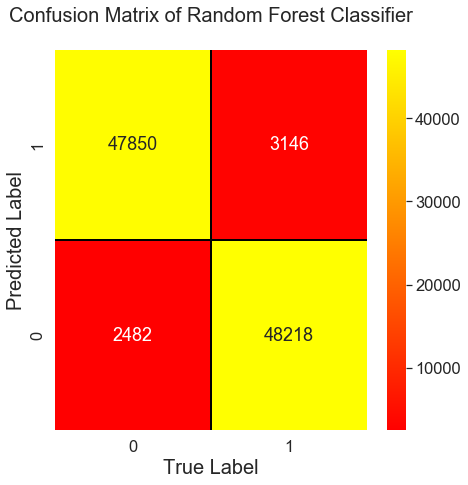

In [101]:
CM=confusion_matrix(y_test,final_model_pred)

x_axis=['0','1']
y_axis=['1','0']

figure,axes=plt.subplots(figsize=(7,7))

sns.set(font_scale=1.5)

sns.heatmap(CM, axes=axes,annot=True,linecolor='black',xticklabels=x_axis,yticklabels=y_axis,cmap='autumn',fmt='0.0f',linewidth=.2)

plt.xlabel('True Label',fontsize=20)
plt.ylabel('Predicted Label',fontsize=20)

plt.title("Confusion Matrix of Random Forest Classifier\n",fontsize=20)

plt.show()

After hyper tuning, our accuracy score for Random Forest Classifier is 94.4%. Which is a good accuracy.

# ROC-AUC Curve

In [102]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import plot_roc_curve

In [103]:
fpr,tpr,thresholds=roc_curve(y_test,final_model_pred)

In [104]:
fpr

array([0.        , 0.06169111, 1.        ])

In [105]:
tpr

array([0.        , 0.95104536, 1.        ])

In [106]:
thresholds

array([2, 1, 0], dtype=int64)

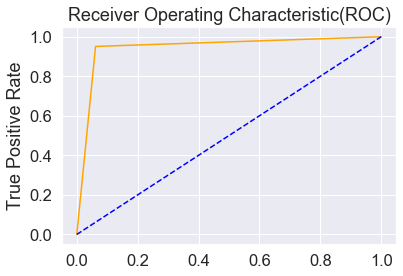

In [123]:
plt.plot(fpr,tpr,color='orange',label='ROC')
plt.plot([0,1],[0,1],color='blue',linestyle='--', label='ROC Curve(area=%0.3f)')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic(ROC)')
plt.show()

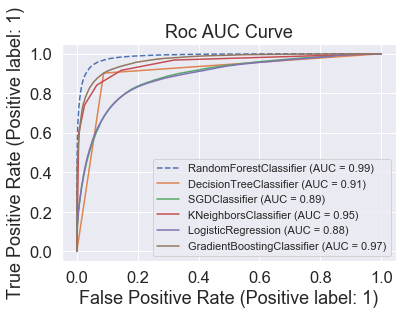

In [124]:
dist=plot_roc_curve(rfc,x_test,y_test,linestyle='--')
plot_roc_curve(dr,x_test,y_test,ax=dist.ax_)
plot_roc_curve(sgd,x_test,y_test,ax=dist.ax_)
plot_roc_curve(knn,x_test,y_test,ax=dist.ax_)
plot_roc_curve(lg,x_test,y_test,ax=dist.ax_)
plot_roc_curve(gbc,x_test,y_test,ax=dist.ax_)
plt.title("Roc AUC Curve")

plt.legend(prop={'size':11},loc='lower right')
plt.show()

In the above ROC AUC Curve, We see that Random Forest gives a great AUC Score 99%.

# Saving the Model

In [125]:
import pickle

In [126]:
filename='micro_credit_defaulter.pickle'

In [128]:
pickle.dump(final_model,open(filename,'wb'))

In [129]:
loaded_model=pickle.load(open(filename,'rb'))

In [130]:
loaded_model.fit(x_train,y_train)

RandomForestClassifier(n_estimators=60)

In [131]:
prediction=loaded_model.predict(x_test)
print("Predicted value:",prediction)

Predicted value: [0 0 1 ... 1 0 1]


In [132]:
print("Accuracy Score:",accuracy_score(y_test,prediction),'\n')
print("Confusion Matrix:\n",confusion_matrix(y_test,prediction),'\n')
print("Classification Report:\n",classification_report(y_test,prediction))

Accuracy Score: 0.9440390969162996 

Confusion Matrix:
 [[47817  3179]
 [ 2512 48188]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.94      0.94     50996
           1       0.94      0.95      0.94     50700

    accuracy                           0.94    101696
   macro avg       0.94      0.94      0.94    101696
weighted avg       0.94      0.94      0.94    101696



In [137]:
df=pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=['Predicted','Actual'])
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

Saved our model.

Here is our Predicted and Actual Value. The value almost looks similar. From this prediction, we can predict which people will pay the loan within 5days.